In [2]:
from PIL import Image
import numpy as np 
import os 


import numpy as np
import matplotlib.pyplot as pl
import torch
import ot
import ot.plot

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Enable interactive mode
%matplotlib ipympl
os.environ["CUDA_VISIBLE_DEVICES"] = "1" # has not effect

import sys
sys.path.append("../")
device="cuda"
from tqdm import tqdm_notebook as tqdm

from gaussian_renderer import render, network_gui
from arguments import ModelParams, PipelineParams, OptimizationParams
import argparse
from scene import Scene, GaussianModel
from random import randint
from argparse import ArgumentParser, Namespace

In [3]:
saving_steps = [1, 100, 300, 1_000, 3_000, 7_000, 10_000, 15_000, 20_000, 30_000]
parser = ArgumentParser(description="Training script parameters")
lp = ModelParams(parser)
op = OptimizationParams(parser)
pp = PipelineParams(parser)
parser.add_argument('--ip', type=str, default="127.0.0.1")
parser.add_argument('--port', type=int, default=6009)
parser.add_argument('--debug_from', type=int, default=-1)
parser.add_argument('--detect_anomaly', action='store_true', default=False)
parser.add_argument("--test_iterations", nargs="+", type=int, default=saving_steps)
parser.add_argument("--save_iterations", nargs="+", type=int, default=saving_steps)
parser.add_argument("--quiet", action="store_true")
parser.add_argument("--checkpoint_iterations", nargs="+", type=int, default=saving_steps)# default=[])
parser.add_argument("--start_checkpoint", type=str, default = None)
args = parser.parse_args(("-s /home/dimakot55/data/nerf_synthetic/hotdog/ "+\
                         "--model_path /home/dimakot55/workspace/gaussian-splatting/notebooks/GT_lego_cluster2_test_notebook14/").split())#sys.argv[1:])
#args.save_iterations.append(args.iterations)
dataset=lp.extract(args)
pipe=pp.extract(args)
opt=op.extract(args)
os.makedirs(args.model_path, exist_ok=True)

In [4]:
os.makedirs(args.model_path, exist_ok=True)
content_gaussians = GaussianModel(3)
content_scene = Scene(dataset, content_gaussians, shuffle=True)
content_gaussians.training_setup(opt)

Found transforms_train.json file, assuming Blender data set!
Reading Training Transforms
Reading Test Transforms
Loading Training Cameras
Loading Test Cameras
Number of points at initialisation :  100000


In [1054]:

content_gaussians.restore(torch.load("/home/dimakot55/output_data/gs_fitted/gs_fitted/GT_hotdog_spheres/chkpnt30000.pth")[0], opt)
# content_gaussians.restore(torch.load("/home/dimakot55/output_data/gs_fitted/gs_fitted/GT_hotdog/chkpnt30000.pth")[0], opt)
# content_gaussians.restore(torch.load("/home/dimakot55/output_data/gs_my/gs/GT_hotdog/chkpnt30000.pth")[0], opt)

In [1055]:
content_gaussians_features_ds_original = content_gaussians._features_dc.detach().clone()

In [1056]:
content_gaussians._features_dc.data = content_gaussians._xyz.data.clone().detach().unsqueeze(1)
content_gaussians._features_rest.data = content_gaussians._features_rest.data * 0.

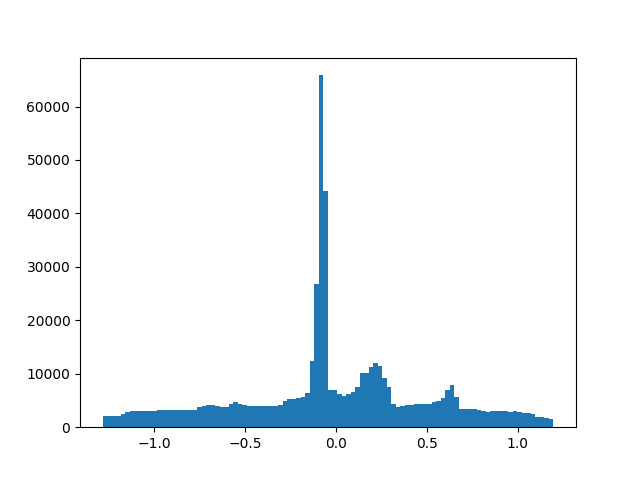

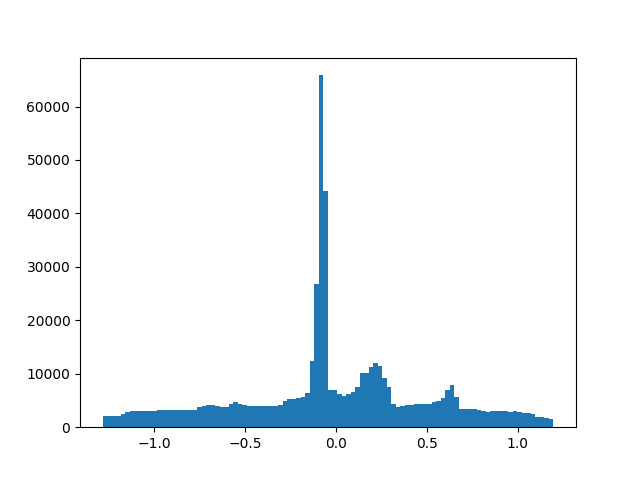

In [1057]:
plt.figure()
plt.hist(content_gaussians._features_dc.detach().cpu().numpy().flatten(), bins=100)
plt.show()
plt.figure()
plt.hist(content_gaussians._xyz.detach().cpu().numpy().flatten(), bins=100)
plt.show()

In [1058]:

bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device=device)

In [1059]:
viewpoint_stack = content_scene.getTrainCameras().copy()
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))



In [1060]:

render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]



In [1061]:
background

tensor([0., 0., 0.], device='cuda:0')

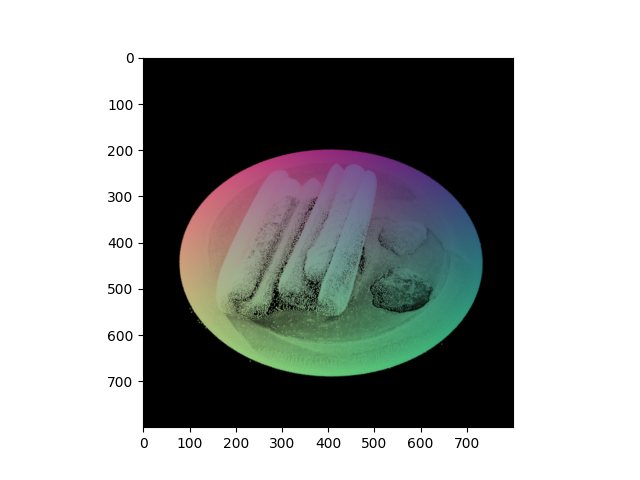

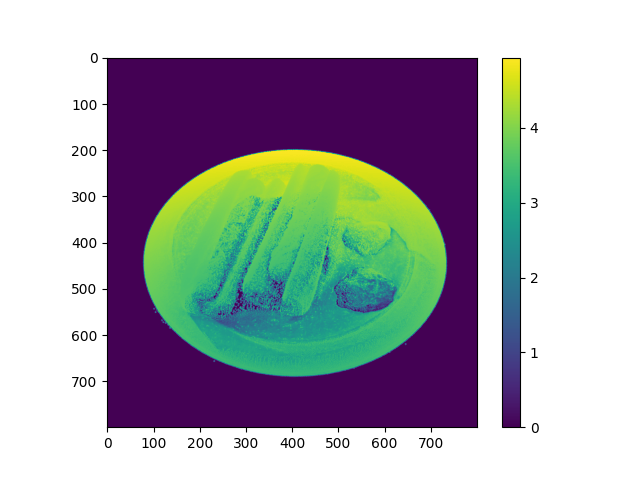

In [1062]:
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


depth_np = depth_cont.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()


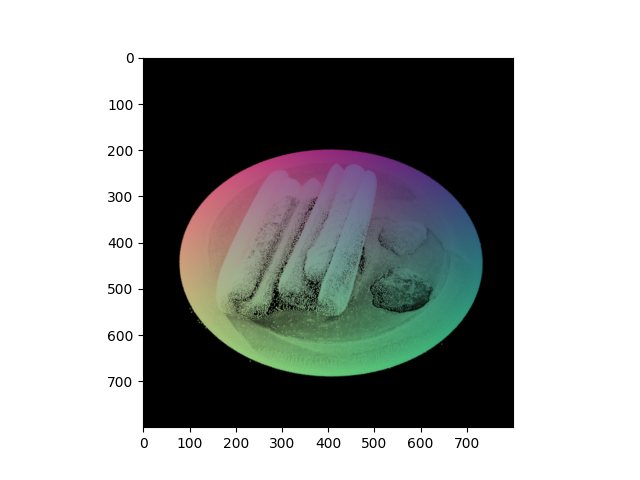

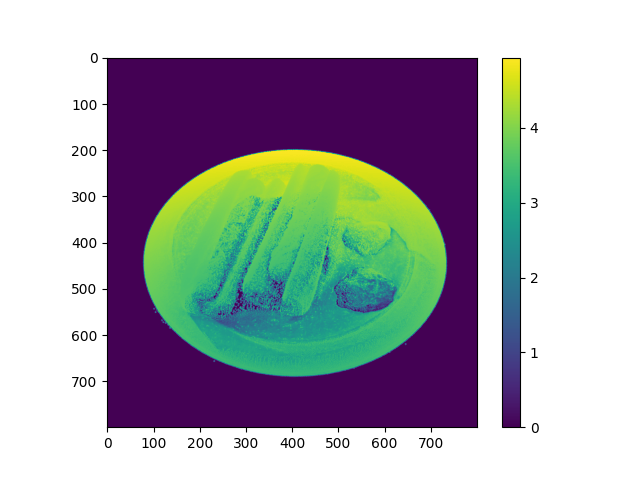

In [1063]:
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


depth_np = depth_cont.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()


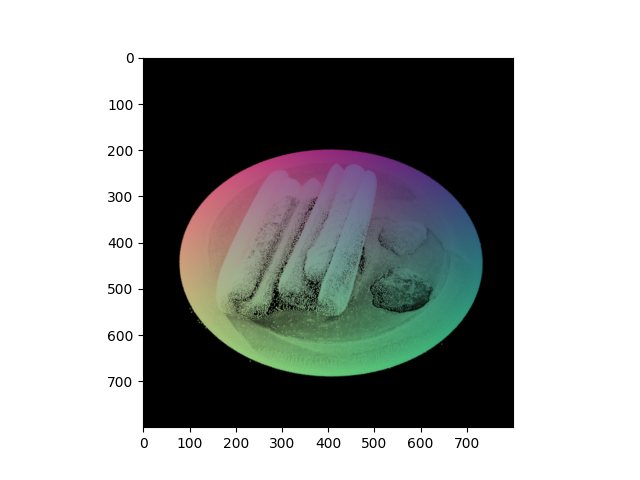

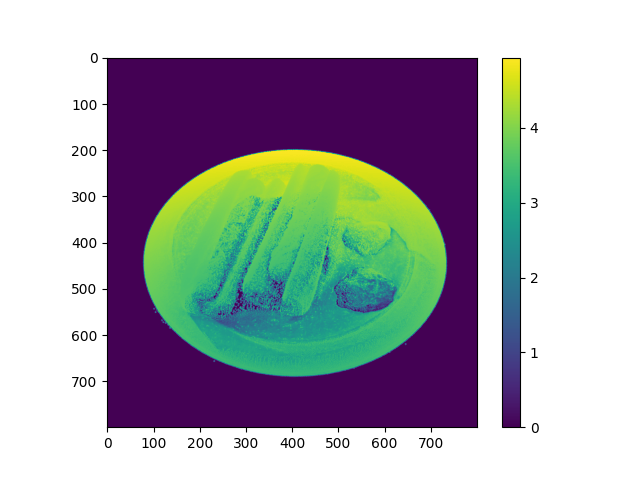

In [1064]:
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


depth_np = depth_cont.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()


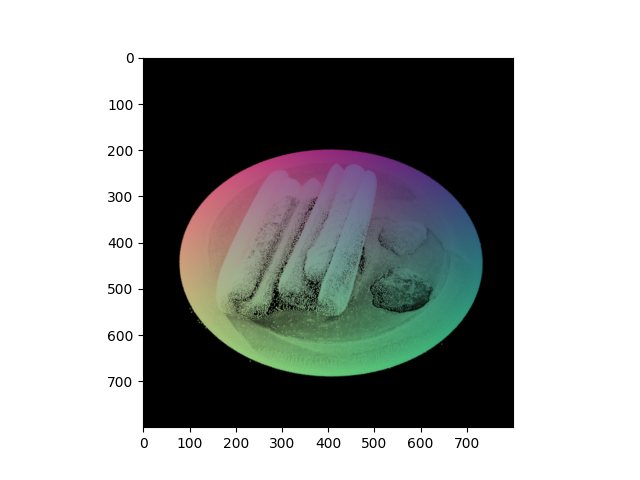

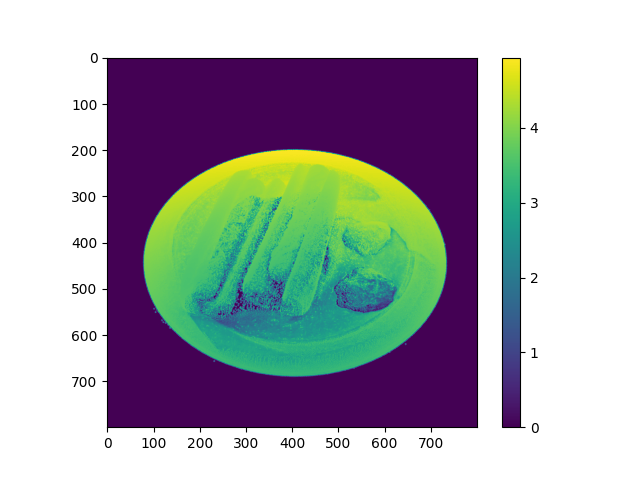

In [1065]:
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


depth_np = depth_cont.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()


In [40]:
gaussians_opt = GaussianModel(3)#.to(device="cuda")
scene_opt = Scene(dataset, gaussians_opt, shuffle=True)


Found transforms_train.json file, assuming Blender data set!
Reading Training Transforms
Reading Test Transforms
Loading Training Cameras
Loading Test Cameras
Number of points at initialisation :  100000


In [23]:
with torch.no_grad():
    gaussians_opt._scaling.data = gaussians_opt._scaling.data * 2.#  + 100.1
    gaussians_opt._opacity.data = gaussians_opt._opacity.data * 0. + 100.1

In [24]:
with torch.no_grad():
    gaussians_opt._scaling.data = gaussians_opt._scaling.data * 2.#

In [41]:
gaussians_cont = content_gaussians

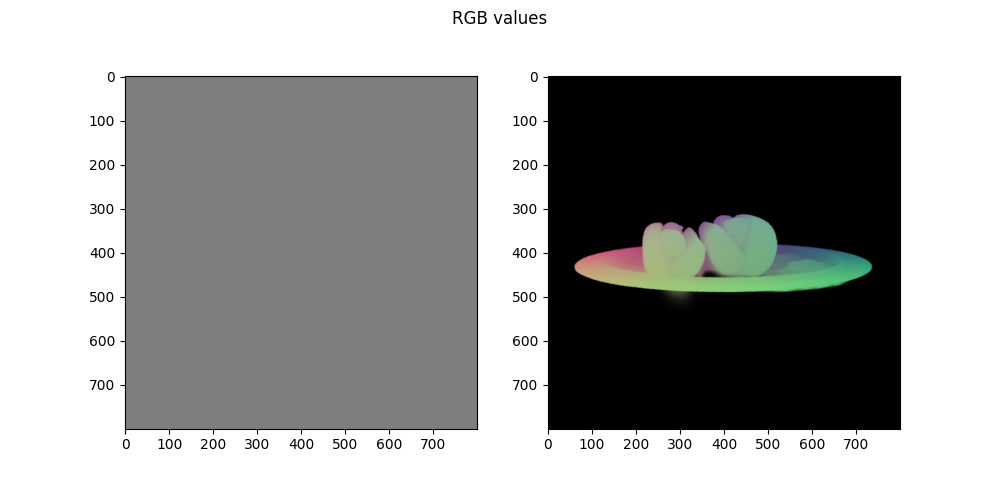

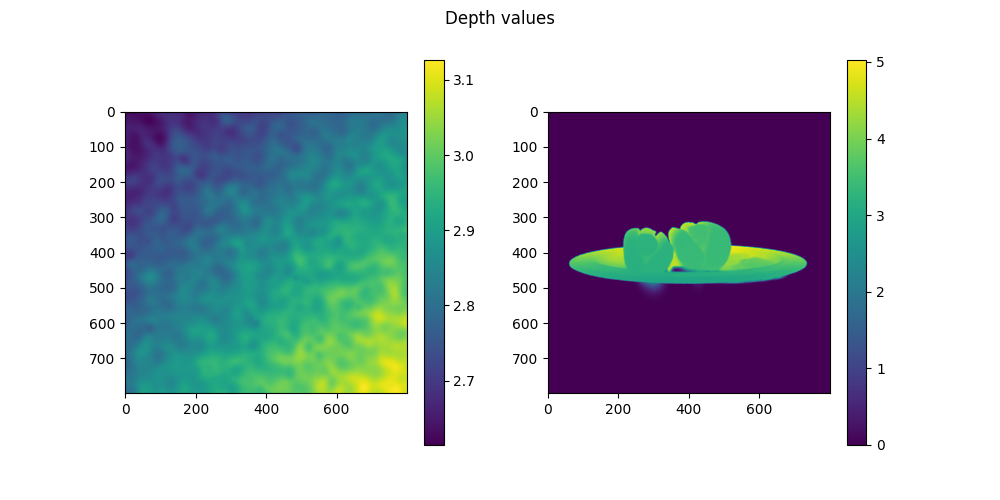

In [42]:
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
        
# Optimization gaussians
render_pkg_opt = render(viewpoint_cam, gaussians_opt, pipe, background)
render_pkg_cont = render(viewpoint_cam, gaussians_cont, pipe, background)
image_opt, depth_opt= render_pkg_opt["render"], render_pkg_opt["depth"]
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
fig.suptitle("RGB values")
image_rgb = image_opt.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[0].imshow(image_rgb)
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax2 = ax[1].imshow(image_rgb)
plt.show()

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
fig.suptitle("Depth values")
depth_np = depth_opt.detach().cpu().numpy()
ax0 = ax[0].imshow(depth_np)
depth_np = depth_cont.detach().cpu().numpy()
ax1 = ax[1].imshow(depth_np)
fig.colorbar(ax0, ax=ax[0])
fig.colorbar(ax1, ax=ax[1])
plt.show()

In [43]:
def calculate_ema(values, alpha=0.01):
    ema = [values[0]]  # Initial value is the same as the first value in the list

    for i in range(1, len(values)):
        ema.append(alpha * values[i] + (1 - alpha) * ema[-1])

    return ema


def l1_loss(network_output, gt):
    return torch.abs((network_output - gt)).mean()


def tv_loss(img):
    return 0.5 * (torch.abs(img[..., 1:, :] - img[..., :-1, :]).mean() +
                  torch.abs(img[..., :, 1:] - img[..., :, :-1]).mean())



In [44]:
gaussians_opt.training_setup(opt)
for param_group in gaussians_opt.optimizer.param_groups:
        param_group['lr'] = 1e-3

# gaussians_opt._xyz.requires_grad_ = True
# gaussians_opt._features_dc.requires_grad_ = False
# gaussians_opt._features_rest.requires_grad_ = False
# gaussians_opt._scaling.requires_grad_ = False
# gaussians_opt._rotation.requires_grad_ = False
# gaussians_opt._opacity.requires_grad_ = False
# gaussians_opt.max_radii2D.requires_grad_ = False

gaussians_opt._xyz.requires_grad_ = True
gaussians_opt._features_dc.requires_grad_ = True
gaussians_opt._features_rest.requires_grad_ = True
gaussians_opt._scaling.requires_grad_ = True
gaussians_opt._rotation.requires_grad_ = True
gaussians_opt._opacity.requires_grad_ = True
gaussians_opt.max_radii2D.requires_grad_ = True

In [45]:
losses_content = []
losses_style = []
losses_tv = []
losses_full = []

In [51]:
ema_loss_for_log = 0.
first_iter = 501
progress_bar = tqdm(range(first_iter, opt.iterations), desc="Training progress")

for iteration in range(first_iter, opt.iterations + 1):
    #gaussians_opt.update_learning_rate(iteration)

    # Every 1000 its we increase the levels of SH up to a maximum degree
    if iteration % 1000 == 0:
        gaussians_opt.oneupSHdegree()

    # Pick a random Camera
    if not viewpoint_stack:
        viewpoint_stack = scene_opt.getTrainCameras().copy()
        #print("viewpoint_stack:", viewpoint_stack)
    viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
        


    # Optimization gaussians
    render_pkg_opt = render(viewpoint_cam, gaussians_opt, pipe, background)
    render_pkg_cont = render(viewpoint_cam, gaussians_cont, pipe, background)
    image_opt, depth_opt= render_pkg_opt["render"], render_pkg_opt["depth"]
    image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]

    viewspace_point_tensor, visibility_filter, radii = render_pkg_opt["viewspace_points"], render_pkg_opt["visibility_filter"], render_pkg_opt["radii"]

    # Visualize images.  
    if False:
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))
        fig.suptitle("RGB values")
        image_rgb = image_stl.detach().cpu().numpy().transpose(1, 2, 0)
        image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
        ax0 = ax[0].imshow(image_rgb)
        image_rgb = image_opt.detach().cpu().numpy().transpose(1, 2, 0)
        image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
        ax1 = ax[1].imshow(image_rgb)
        image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
        image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
        ax2 = ax[2].imshow(image_rgb)
        plt.show()

        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12,4))
        fig.suptitle("Depth values")
        depth_np = depth_stl.detach().cpu().numpy()
        ax0 = ax[0].imshow(depth_np)
        depth_np = depth_opt.detach().cpu().numpy()
        ax1 = ax[1].imshow(depth_np)
        depth_np = depth_cont.detach().cpu().numpy()
        ax2 = ax[2].imshow(depth_np)
        fig.colorbar(ax0, ax=ax[0])
        fig.colorbar(ax1, ax=ax[1])
        fig.colorbar(ax2, ax=ax[2])
        plt.show()
        

    # Compute losses and optimize
    # l_cont = l1_loss(depth_opt, depth_cont)
    # l_tv = tv_loss(depth_opt)

    l_cont = l1_loss(image_opt, image_cont)
    l_tv = tv_loss(image_opt)

    #l_cont = l_stl = l_tv
    l_reg = torch.mean(torch.square(gaussians_opt._xyz.unsqueeze(1) - gaussians_opt._features_dc))
    
    loss = l_cont * 1e2 + l_tv * 1e-5 + l_reg * 1e2# tv_loss weight was 1e-3

    

    
        
    # if (iteration % 100 == 0) and True:
    #     print(f"l_tv:{calculate_ema(losses_tv)[-1]:.7f}, l_cont:{calculate_ema(losses_content)[-1]:.7f}",
    #           f"l_stl:{calculate_ema(losses_style)[-1]:.7f}, loss:{calculate_ema(losses_full)[-1]:.7f}")
    loss.backward()
    
    
    with torch.no_grad():
        # Progress bar
        ema_loss_for_log = 0.4 * loss.item() + 0.6 * ema_loss_for_log
        if iteration % 50 == 0:
            progress_bar.set_postfix({"Loss": f"{ema_loss_for_log:.{7}f}"})
            progress_bar.update(10)
        if iteration == opt.iterations:
            progress_bar.close()

        # # Densification
        # if iteration < opt.densify_until_iter:
        #     # Keep track of max radii in image-space for pruning
        #     gaussians_opt.max_radii2D[visibility_filter] = torch.max(gaussians_opt.max_radii2D[visibility_filter], radii[visibility_filter])
        #     gaussians_opt.add_densification_stats(viewspace_point_tensor, visibility_filter)

        #     if iteration > opt.densify_from_iter and iteration % opt.densification_interval == 0:
        #         size_threshold = 20 if iteration > opt.opacity_reset_interval else None
        #         gaussians_opt.densify_and_prune(opt.densify_grad_threshold, 0.005, scene_opt.cameras_extent, size_threshold)

        #     if iteration % opt.opacity_reset_interval == 0 or (dataset.white_background and iteration == opt.densify_from_iter):
        #         gaussians_opt.reset_opacity()
        # Optimizer step
        if iteration < opt.iterations:
            gaussians_opt.optimizer.step()
            gaussians_opt.optimizer.zero_grad(set_to_none = True)
    
    losses_content.append(l_cont.data.cpu().numpy())
    losses_tv.append(l_tv.data.cpu().numpy())
    losses_style.append(l_reg.data.cpu().numpy())
    losses_full.append(loss.data.cpu().numpy())
    
    if (iteration % 100 == 0) and True:
        print(f"l_tv:{losses_tv[-1]:.7f}, l_cont:{losses_content[-1]:.7f}",
              f"l_reg:{losses_style[-1]:.7f}, loss:{losses_full[-1]:.7f}")


/tmp/ipykernel_446665/4221846666.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  progress_bar = tqdm(range(first_iter, opt.iterations), desc="Training progress")


Training progress:   0%|          | 0/29499 [00:00<?, ?it/s]

l_tv:0.0015904, l_cont:0.0046297 l_reg:0.0001913, loss:0.4820942
l_tv:0.0017360, l_cont:0.0041430 l_reg:0.0001636, loss:0.4306624
l_tv:0.0017215, l_cont:0.0057601 l_reg:0.0001403, loss:0.5900453
l_tv:0.0017273, l_cont:0.0040092 l_reg:0.0001195, loss:0.4128706
l_tv:0.0016478, l_cont:0.0053311 l_reg:0.0001052, loss:0.5436319
l_tv:0.0016542, l_cont:0.0045910 l_reg:0.0000942, loss:0.4685227
l_tv:0.0015809, l_cont:0.0035839 l_reg:0.0000832, loss:0.3667108
l_tv:0.0015815, l_cont:0.0051007 l_reg:0.0000745, loss:0.5175120
l_tv:0.0018852, l_cont:0.0053297 l_reg:0.0000669, loss:0.5396642
l_tv:0.0017171, l_cont:0.0041919 l_reg:0.0000624, loss:0.4254234
l_tv:0.0018843, l_cont:0.0049674 l_reg:0.0000556, loss:0.5022907
l_tv:0.0022636, l_cont:0.0076617 l_reg:0.0000506, loss:0.7712358
l_tv:0.0019064, l_cont:0.0038040 l_reg:0.0000473, loss:0.3851285
l_tv:0.0014520, l_cont:0.0037218 l_reg:0.0000433, loss:0.3765107
l_tv:0.0018549, l_cont:0.0039263 l_reg:0.0000397, loss:0.3965987
l_tv:0.0014961, l_cont:0.

KeyboardInterrupt: 

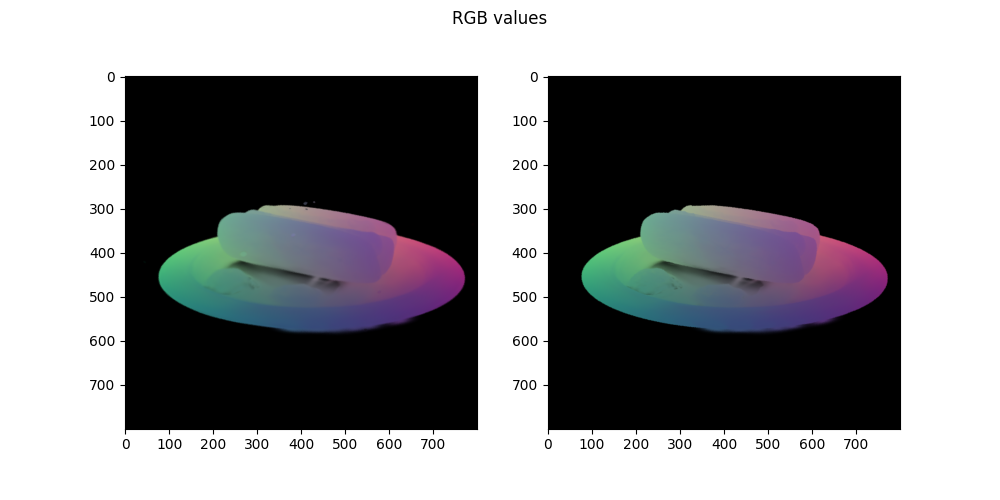

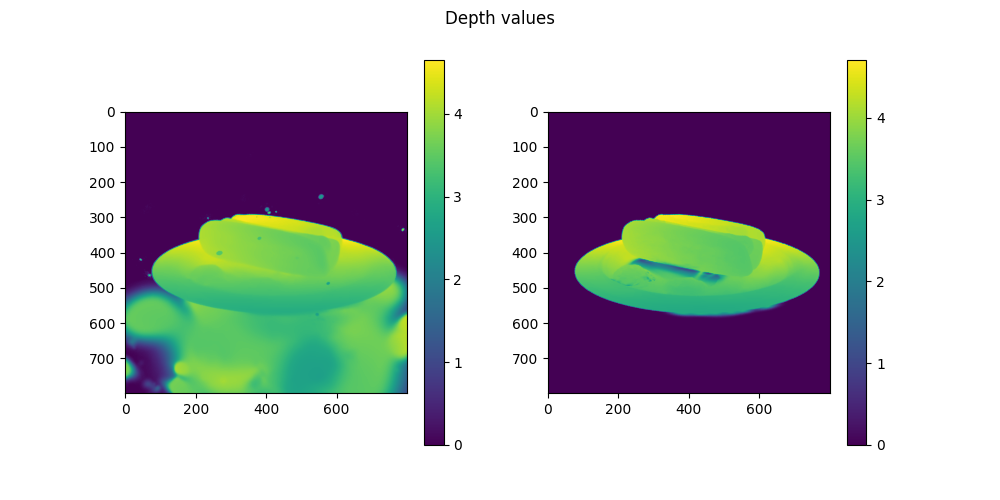

In [55]:
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
        
# Optimization gaussians
render_pkg_opt = render(viewpoint_cam, gaussians_opt, pipe, background)
render_pkg_cont = render(viewpoint_cam, gaussians_cont, pipe, background)
image_opt, depth_opt= render_pkg_opt["render"], render_pkg_opt["depth"]
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
fig.suptitle("RGB values")
image_rgb = image_opt.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[0].imshow(image_rgb)
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax2 = ax[1].imshow(image_rgb)
plt.show()

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
fig.suptitle("Depth values")
depth_np = depth_opt.detach().cpu().numpy()
ax0 = ax[0].imshow(depth_np)
depth_np = depth_cont.detach().cpu().numpy()
ax1 = ax[1].imshow(depth_np)
fig.colorbar(ax0, ax=ax[0])
fig.colorbar(ax1, ax=ax[1])
plt.show()

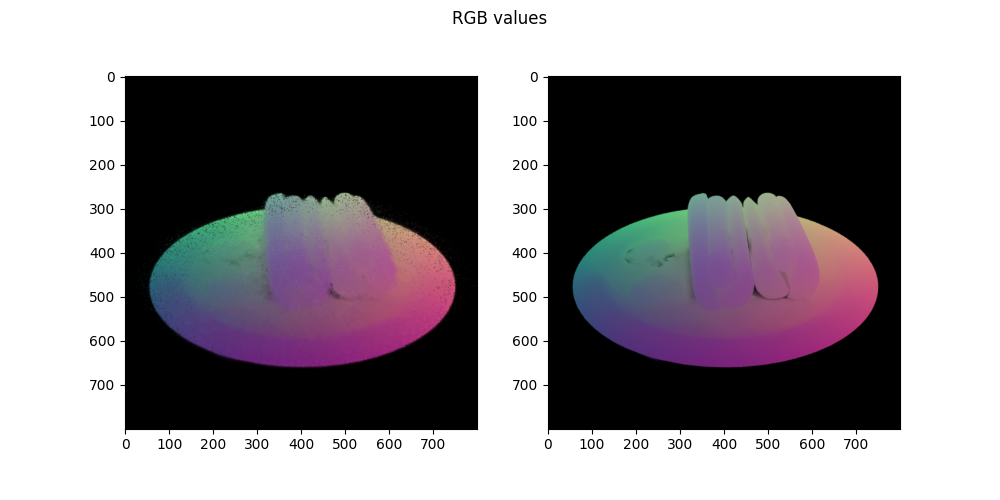

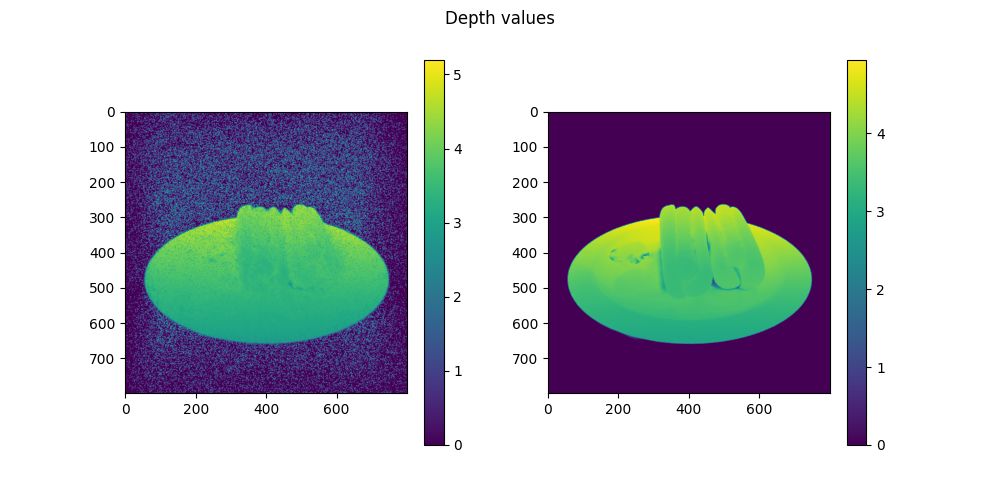

In [35]:
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
        
# Optimization gaussians
render_pkg_opt = render(viewpoint_cam, gaussians_opt, pipe, background)
render_pkg_cont = render(viewpoint_cam, gaussians_cont, pipe, background)
image_opt, depth_opt= render_pkg_opt["render"], render_pkg_opt["depth"]
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]


fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
fig.suptitle("RGB values")
image_rgb = image_opt.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax1 = ax[0].imshow(image_rgb)
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
image_rgb = np.clip(image_rgb*255, 0, 255).astype(np.uint8) 
ax2 = ax[1].imshow(image_rgb)
plt.show()

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
fig.suptitle("Depth values")
depth_np = depth_opt.detach().cpu().numpy()
ax0 = ax[0].imshow(depth_np)
depth_np = depth_cont.detach().cpu().numpy()
ax1 = ax[1].imshow(depth_np)
fig.colorbar(ax0, ax=ax[0])
fig.colorbar(ax1, ax=ax[1])
plt.show()

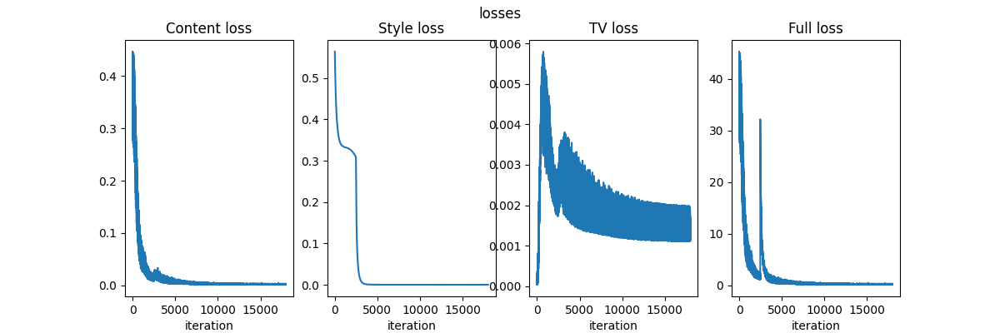

In [52]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(12,4))
fig.suptitle("losses")
ax[0].set_title("Content loss")
ax[0].plot(losses_content)
ax[1].set_title("Style loss")
ax[1].plot(losses_style)

ax[2].set_title("TV loss")
ax[2].plot(losses_tv)
ax[3].set_title("Full loss")
ax[3].plot(losses_full)

for i in range(4): ax[i].set_xlabel("iteration")

plt.show()

# style scene preparation

In [1108]:

import torch
import torch.nn.functional as F
from scipy.spatial import distance
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA


def sample_points_by_density(points, num_samples=None, radius = 0.05, device='cuda'):
    """
    Samples points inversely proportional to their density in the neighborhood.
    :param points: torch tensor of shape [N,3]
    :param num_samples: Number of samples to be drawn according to the
        distribution of densities. If None, then we sample 1/10th of the points.
    :param radius: Radius of the local region around each point at which we compute
        the number of neighbors.
    :param device: Device on which the tensors are stored and computations will be done.
    :return: A torch tensor of shape [num_samples] containing the indices of the sampled points
    """


    # Assuming you have a PyTorch tensor of shape [N, 3] representing points
    # Calculate pairwise distances between all points
    # Note that i only compute distance to every 10th neighbor.
    distances = torch.cdist(points, points[::10])


    # Calculate the number of points within the local region for each point
    num_points_in_local_region = (distances <= radius).sum(dim=1)

    # Calculate the inverse density as a weight
    inverse_density = 1.0 / (num_points_in_local_region + 1)  # Add 1 to avoid division by zero

    # Normalize the weights to create a probability distribution
    probability_distribution = inverse_density / inverse_density.sum()

    # Sample points inversely proportional to their density
    if num_samples is None:
        num_samples = len(points) // 10  # Adjust the number of samples as needed
    sampled_indices = torch.multinomial(probability_distribution, num_samples, replacement=True)

    return sampled_indices
    
def remove_outliers(points, kth_neighbor=30, q=0.925, device='cuda'):
    """
    Removes outliers from the given points. Usually the set of clusters must be small to avoid
    quadratic complexity of the all pairwise neighbors computation.
    :param points: torch tensor of shape [N, 3]
    :param kth_neighbor: this neighbor we use to approximate good neighborhood density.
    :param q: Quantile to use for removing outliers.
    :param device: Device on which the tensors are stored and computations will be done.
    :return: A torch tensor of shape [N] containing the indices of the non-outlier points.
    """

    pairwise_distances = torch.cdist(points, points)
    kth_nearest_dists, kth_nearest_indices = torch.topk(pairwise_distances, k=kth_neighbor, dim=1, largest=False, sorted=True)
    q_outliers = torch.quantile(kth_nearest_dists[:, kth_neighbor-1], q=q)
    indcs_relevant = torch.where(kth_nearest_dists[:, kth_neighbor-1] < q_outliers)[0]
    return indcs_relevant

def prepare_scene(points, num_clusters=40, num_samples=None, radius=0.05, q=0.925, device='cuda'):
    """
    Prepares the scene by sampling points and clustering them.
    :param points: torch tensor of shape [N, 3]
    :param num_clusters: Number of clusters to use for KMeans clustering.
    :param num_samples: Number of samples to be drawn according to the
        distribution of densities. If None, then we sample 1/10th of the points from EACH cluster
    :param radius: Radius of the local region around each point at which we compute
        the number of neighbors.
    :param device: Device on which the tensors are stored and computations will be done.
    :return: A tuple containing the following tensors:
    """

     # Use KMeans clustering to find the centroids of the clusters
    kmeans = KMeans(init="k-means++", n_clusters=num_clusters, n_init=4)
    kmeans.fit(points.detach().cpu().numpy())
    clean_indices = []
    for lbls in np.unique(kmeans.labels_):
        cluster_points_idcs = np.where(kmeans.labels_ == lbls)[0]
        # Remove outliers
        non_outliers_idcs = remove_outliers(points[cluster_points_idcs], q=q, device=device)
        cluster_points_idcs = cluster_points_idcs[non_outliers_idcs.cpu().numpy()]
        # Sample points inversely proportional to the density
        sampled_idcs = sample_points_by_density(points[cluster_points_idcs], num_samples, radius, device)
        cluster_points_idcs = cluster_points_idcs[sampled_idcs.cpu().numpy()]
        clean_indices.append(cluster_points_idcs)

    return clean_indices, kmeans.cluster_centers_, kmeans.labels_[np.concatenate(clean_indices)]


In [1109]:
content_shape_idcs, content_shape_cluster_centers, content_shape_cluster_labels = prepare_scene(
    points=content_gaussians._xyz,
    num_samples=None,
    radius=0.035,
    q=0.975, #0.975,
    num_clusters=250,
    device=device)


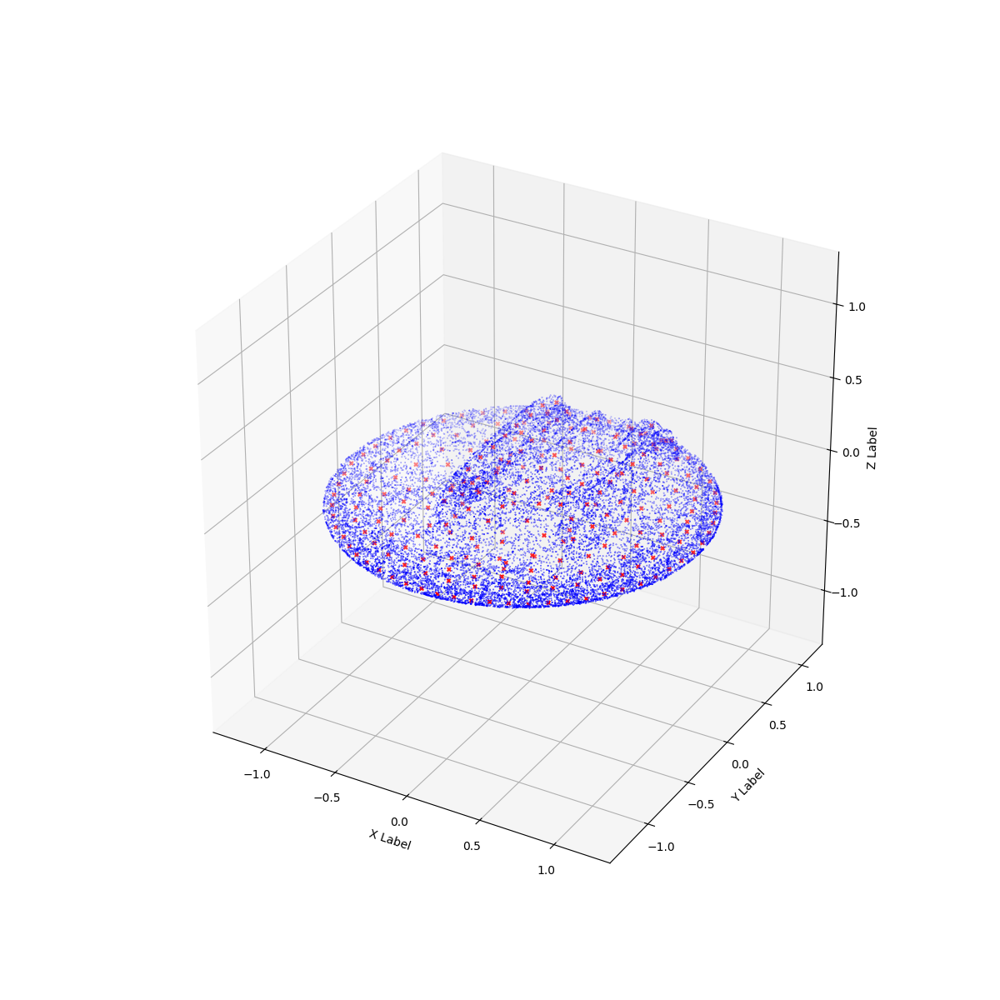

In [1110]:

# Functions from @Mateen Ulhaq and @karlo for visualizing 3d points with equal scaling of axes
def set_axes_equal(ax: plt.Axes):
    """Set 3D plot axes to equal scale.

    Make axes of 3D plot have equal scale so that spheres appear as
    spheres and cubes as cubes.  Required since `ax.axis('equal')`
    and `ax.set_aspect('equal')` don't work on 3D.
    """
    limits = np.array([
        ax.get_xlim3d(),
        ax.get_ylim3d(),
        ax.get_zlim3d(),
    ])
    origin = np.mean(limits, axis=1)
    radius = 0.5 * np.max(np.abs(limits[:, 1] - limits[:, 0]))
    _set_axes_radius(ax, origin, radius)

def _set_axes_radius(ax, origin, radius):
    x, y, z = origin
    ax.set_xlim3d([x - radius, x + radius])
    ax.set_ylim3d([y - radius, y + radius])
    ax.set_zlim3d([z - radius, z + radius])


# Create a 3D scatter plot
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=1
if True:
    arr_shape = content_gaussians._xyz[np.concatenate(content_shape_idcs, axis=0)].detach().cpu().numpy()
    ax.scatter(arr_shape[::kth,0], 
               arr_shape[::kth,1], 
               arr_shape[::kth,2], c='b', marker='o',s=0.1)

ax.scatter(content_shape_cluster_centers[:, 0],
           content_shape_cluster_centers[:, 1],
           content_shape_cluster_centers[:, 2],
           c='r', marker='x', s=10.)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()



# Style scene preparation

In [1069]:
loaded_data = np.load("/home/dimakot55/output_data/gs/GT_lego_spheres_v5_clusters_100/cluster_51.npz") # 51, 36, 49, 24, 40, 57, 45, 22, 20, 3, 32, 25,  19, 16, 17, 15, 13, 14

#loaded_data = np.load("/home/dimakot55/output_data/gs_my/GT_brickwall_spheres_clusters_50/cluster_14.npz") # 51, 36, 49, 24, 40, 57, 45, 22, 20, 3, 32, 25,  19, 16, 17, 15, 13, 14

# Access the arrays by their names
gaussians_xyz = loaded_data['_xyz']
gaussians_features_dc = loaded_data['_features_dc']
gaussians_features_rest = loaded_data['_features_rest']
gaussians_rotation = loaded_data['_rotation']
gaussians_scaling = loaded_data['_scaling']
gaussians_opacity = loaded_data['_opacity']

# 0. only for the bricks scene. Remove poitns underneath. and change size to smaller scale. Multiply coordinates and sizes.
idcs = np.where(gaussians_xyz[:,2]>-0.12)[0]
gaussians_xyz = gaussians_xyz[idcs]
gaussians_features_dc = gaussians_features_dc[idcs]
gaussians_features_rest = gaussians_features_rest[idcs]
gaussians_rotation = gaussians_rotation[idcs]
gaussians_scaling = gaussians_scaling[idcs]
gaussians_opacity = gaussians_opacity[idcs]




# 1. Remove poitns that are too far away from all other points. These are just noise
# Compute all pairwise distances between points
from scipy.spatial import distance
k=30
pairwise_distances = distance.cdist(gaussians_xyz, gaussians_xyz, 'euclidean')
# Use np.partition to find the k-th smallest distances for each row
kth_nearest_indices = np.argpartition(pairwise_distances, k, axis=1)[:, :k]
kth_nearest_distances = np.take_along_axis(pairwise_distances, kth_nearest_indices, axis=1)
q_outliers = np.quantile(np.max(kth_nearest_distances, axis=-1), 0.925)
idcs = np.where(np.max(kth_nearest_distances, axis=-1) < q_outliers)[0]
gaussians_xyz = gaussians_xyz[idcs]
gaussians_features_dc = gaussians_features_dc[idcs]
gaussians_features_rest = gaussians_features_rest[idcs]
gaussians_rotation = gaussians_rotation[idcs]
gaussians_scaling = gaussians_scaling[idcs]
gaussians_opacity = gaussians_opacity[idcs]

# preprocess colors
colors = np.array(gaussians_features_dc[:,0])
#colors = (colors - np.min(colors)) / (np.max(colors) - np.min(colors))
def sigmoid(x):
    return 1 / (1 + np.exp(-x))
colors=sigmoid(colors)

# preprocess sizes. Transform scaling to a format somewhat acceptable 
# by the ax.scatter function
sizes = np.array(gaussians_scaling[:,0])
q05 = np.quantile(sizes, 0.5)
#sizes = sizes * (sizes > q05)
sizes = -sizes * 4. 

# Transform opacity to the format acceptable by ax.scatter
alpha = np.array(gaussians_opacity[:,0])
#alpha = alpha / np.max(alpha)
alpha = np.clip(alpha, 0., 1.)


# Extra increase the volume of the points to make results more apparent
with torch.no_grad():
    # gaussians_xyz[:,2] = gaussians_xyz[:,2]*1.5 # for lego
    gaussians_xyz[:,2] = gaussians_xyz[:,2]*1.5 # for bricks 

In [1070]:
content_gaussians._xyz.data.shape

torch.Size([189950, 3])

In [1077]:

d_inter, d_outer = get_cluster_radius(gaussians_xyz)
print("Inter and outer radii of the style patch:", d_inter, d_outer)

! date
domain_circles = sample_circles(points=content_gaussians._xyz.data[::5].detach().cpu().numpy(), r=d_outer * 0.45)
# Remove circles with too few points
domain_circles = [x for x in domain_circles if len(x) > 21]
! date

Inter and outer radii of the style patch: 0.1543036130194805 0.30615902221658997
Mon Nov 20 12:47:18 PST 2023
Mon Nov 20 12:47:28 PST 2023


In [1080]:
len(domain_circles)

245

In [1081]:
domain_circles_centers = torch.stack([torch.mean(content_gaussians._xyz.data[::5][domain_circle], dim=0) for domain_circle in domain_circles],
                                     dim=0).detach().cpu().numpy()

In [1082]:
import numpy as np
from scipy.spatial import distance

def get_cluster_radius(cluster_points):
    """
    Computes minimum and maximum of all the largest pairwise distances
    in the cluster. These correspond to the largest inner and largest outter circle.
    Main assumption is that the shape is connected. For flat surfaces use the 
    largest area and decrease it a bit. 
    :param cluster_points: Numpy array of shape [N,d]
    :return inner diameter and outer diameter 
    """

    pairwise_distances = distance.cdist(cluster_points, cluster_points)
    pairwise_max_distances = np.max(pairwise_distances, axis=1)
    outer_max_d = np.max(pairwise_max_distances)
    inner_max_d = np.min(pairwise_max_distances)
    return inner_max_d, outer_max_d


def sample_circles(points, r, min_points_per_cluster=40):
    N, d = points.shape

    # Compute matrix of all pairwise distances
    pairwise_distances = distance.cdist(points, points)

    # Create a boolean array to track covered elements
    covered = np.zeros(N, dtype=bool)

    # List to store the indices of points in each circle
    circles = []

    while not all(covered):
        # Find the index of the next uncovered point
        query_point_idx = np.where(covered == 0)[0][0]
        points_indices_in_circle = []
        r_ = r
        while len(points_indices_in_circle) < min_points_per_cluster:
            points_indices_in_circle = np.where(pairwise_distances[query_point_idx] <= r_)[0]
            r_ = r_*2
        covered[points_indices_in_circle] = True
        # Add the current circle to the list
        circles.append(points_indices_in_circle)

    return circles


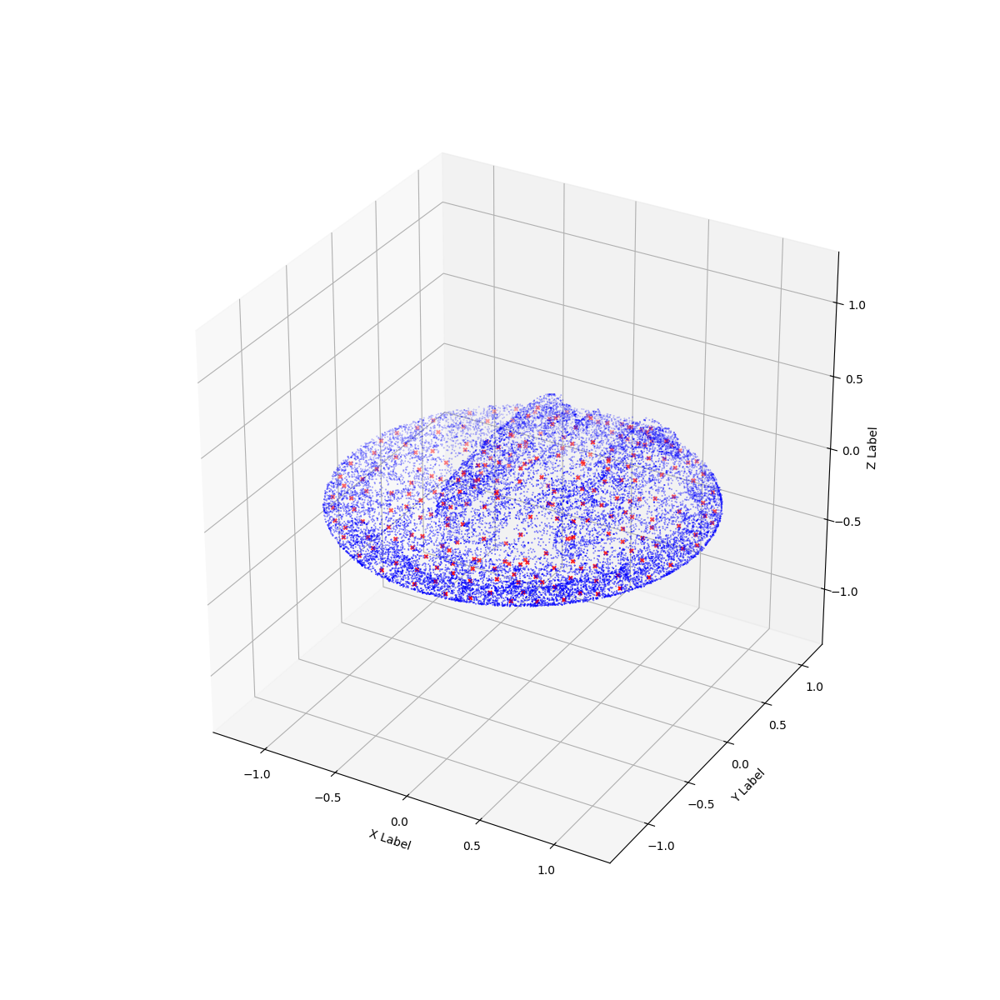

In [1083]:

# Functions from @Mateen Ulhaq and @karlo for visualizing 3d points with equal scaling of axes
def set_axes_equal(ax: plt.Axes):
    """Set 3D plot axes to equal scale.

    Make axes of 3D plot have equal scale so that spheres appear as
    spheres and cubes as cubes.  Required since `ax.axis('equal')`
    and `ax.set_aspect('equal')` don't work on 3D.
    """
    limits = np.array([
        ax.get_xlim3d(),
        ax.get_ylim3d(),
        ax.get_zlim3d(),
    ])
    origin = np.mean(limits, axis=1)
    radius = 0.5 * np.max(np.abs(limits[:, 1] - limits[:, 0]))
    _set_axes_radius(ax, origin, radius)

def _set_axes_radius(ax, origin, radius):
    x, y, z = origin
    ax.set_xlim3d([x - radius, x + radius])
    ax.set_ylim3d([y - radius, y + radius])
    ax.set_zlim3d([z - radius, z + radius])


# Create a 3D scatter plot
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=1
if True:
    arr_shape = content_gaussians._xyz[np.concatenate(content_shape_idcs, axis=0)].detach().cpu().numpy()
    ax.scatter(arr_shape[::kth,0], 
               arr_shape[::kth,1], 
               arr_shape[::kth,2], c='b', marker='o',s=0.1)

ax.scatter(domain_circles_centers[:, 0],
           domain_circles_centers[:, 1],
           domain_circles_centers[:, 2],
           c='r', marker='x', s=10.)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()



In [1084]:
content_shape_cluster_centers.shape

(80, 3)

In [1085]:
domain_circles_centers.shape

(245, 3)

In [1086]:
content_shape_cluster_centers = domain_circles_centers

# Now turn that into a colleaction of patches every placed at the position of the content scene cluster

In [1129]:
gaussians_opt = GaussianModel(3)#.to(device="cuda")
scene_opt = Scene(dataset, gaussians_opt, shuffle=True)


Found transforms_train.json file, assuming Blender data set!
Reading Training Transforms
Reading Test Transforms
Loading Training Cameras
Loading Test Cameras
Number of points at initialisation :  100000


In [1111]:
C = len(content_shape_cluster_centers)
gaussians_opt._features_dc.data = torch.concat([torch.tensor(gaussians_features_dc)]*C).to(device=device)
gaussians_opt._features_rest.data = torch.concat([torch.tensor(gaussians_features_rest)*0.]*C).to(device=device)
gaussians_opt._rotation.data = torch.concat([torch.tensor(gaussians_rotation)]*C).to(device=device)
gaussians_opt._scaling.data = torch.concat([torch.tensor(gaussians_scaling)]*C).to(device=device)
gaussians_opt._opacity.data = torch.concat([torch.tensor(gaussians_opacity)]*C).to(device=device)

N = len(gaussians_xyz)

gaussians_opt.max_radii2D.data = torch.concat([torch.tensor(content_gaussians.max_radii2D[:N])]*C).to(device=device)
gaussians_opt.xyz_gradient_accum.data = torch.concat([torch.tensor(content_gaussians.xyz_gradient_accum[:N])]*C).to(device=device)
gaussians_opt.denom.data = torch.concat([torch.tensor(content_gaussians.denom[:N])]*C).to(device=device)

/tmp/ipykernel_446665/2308145428.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gaussians_opt.max_radii2D.data = torch.concat([torch.tensor(content_gaussians.max_radii2D[:N])]*C).to(device=device)
/tmp/ipykernel_446665/2308145428.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gaussians_opt.xyz_gradient_accum.data = torch.concat([torch.tensor(content_gaussians.xyz_gradient_accum[:N])]*C).to(device=device)
/tmp/ipykernel_446665/2308145428.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  gaussians_opt.denom.data = torch.conca

In [1112]:
gaussians_opt._scaling.data += 0.0 # 1.5
#gaussians_opt._opacity.data += 10.


In [1113]:
gaussians_opt._xyz.data = torch.concat([torch.tensor(gaussians_xyz - np.mean(gaussians_xyz, axis=0) + cluster_center).to(device=device) 
                                          for cluster_center in content_shape_cluster_centers])

# Make clusters double the size 
# gaussians_opt._xyz.data = torch.concat([torch.tensor( (gaussians_xyz - np.mean(gaussians_xyz, axis=0))*2.0 + cluster_center).to(device=device) 
#                                           for cluster_center in content_shape_cluster_centers])

In [1114]:

bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device=device)

In [1115]:
viewpoint_stack = scene_opt.getTrainCameras().copy()
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))



In [1116]:

render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, depth= render_pkg["render"], render_pkg["depth"]

render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]



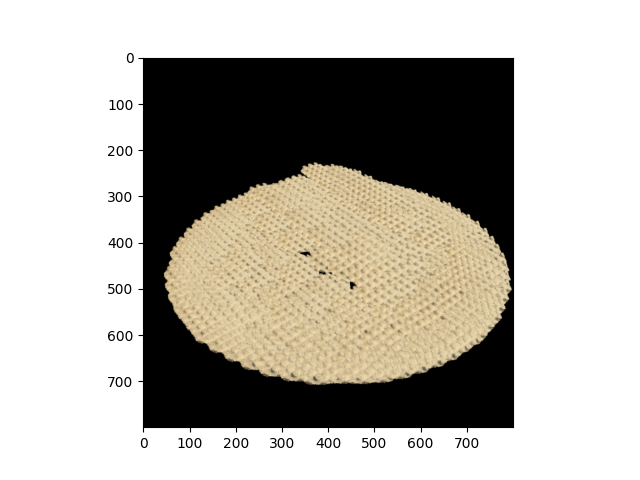

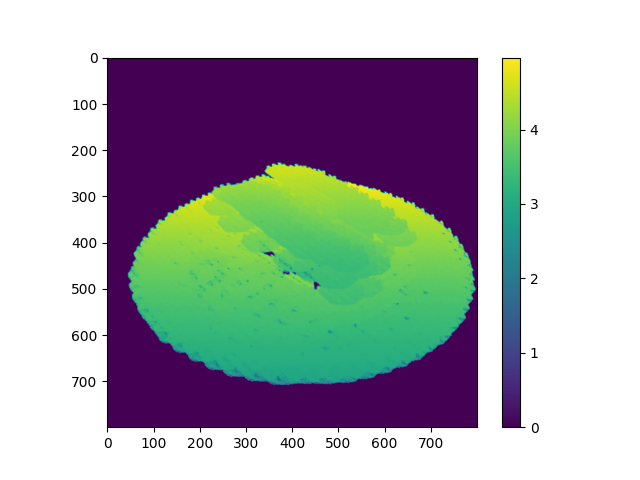

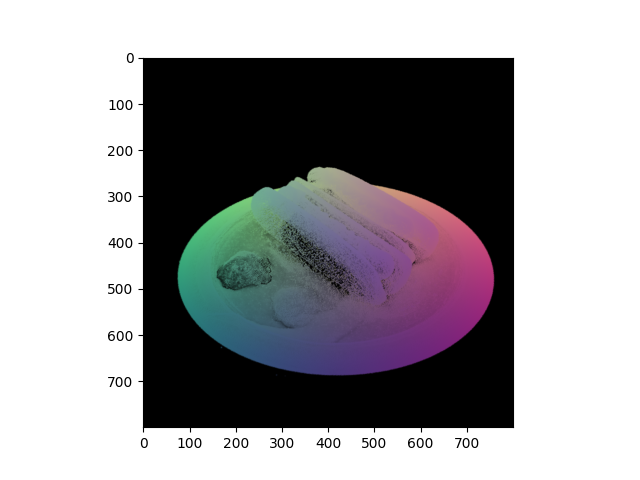

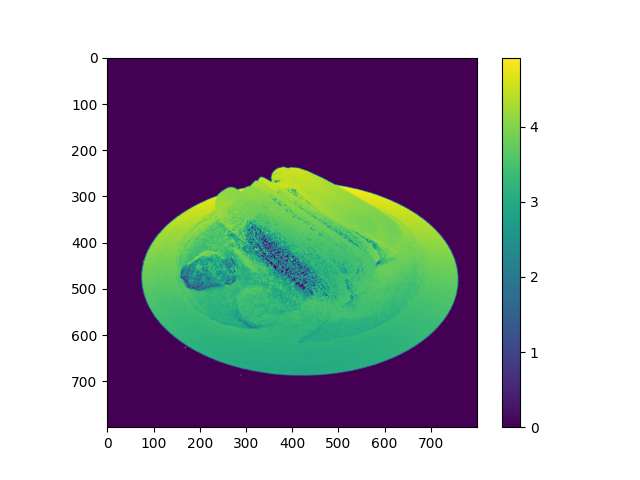

In [1117]:
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


depth_np = depth.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()

image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


depth_np = depth_cont.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()

## Prepare optimization scene. Color into gaussians by their coordinate and save initial color values

In [1118]:
gaussians_opt_features_dc_original = gaussians_opt._features_dc.data.detach().clone()
with torch.no_grad():
    gaussians_opt._features_dc.data = gaussians_opt._xyz.data.clone().detach().unsqueeze(1)
    gaussians_opt._features_rest.data = gaussians_opt._features_rest.data * 0.

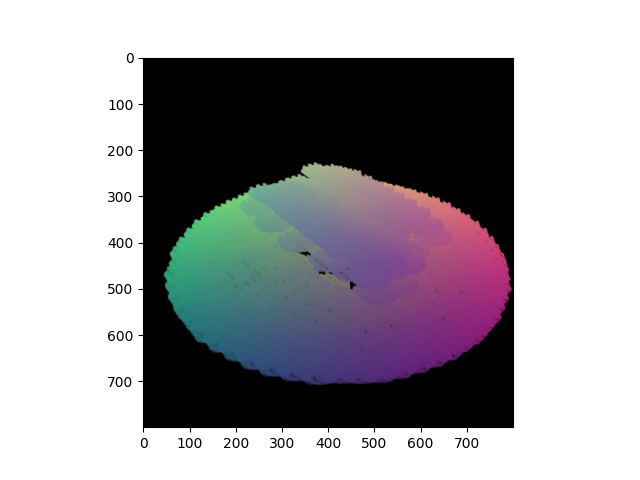

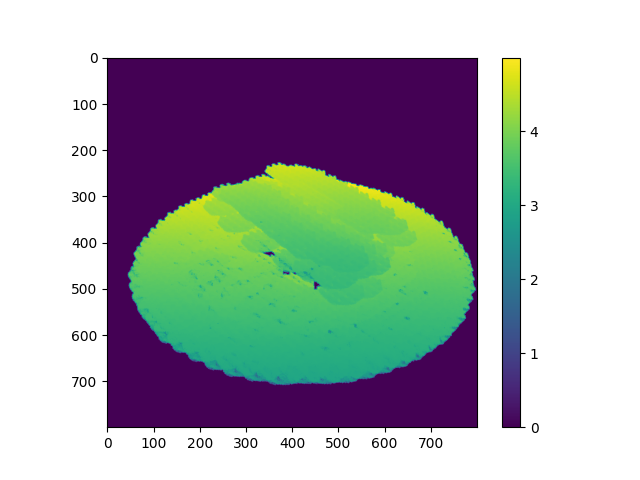

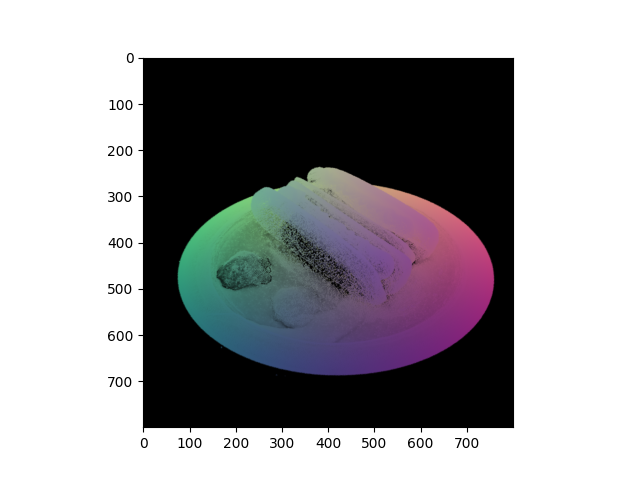

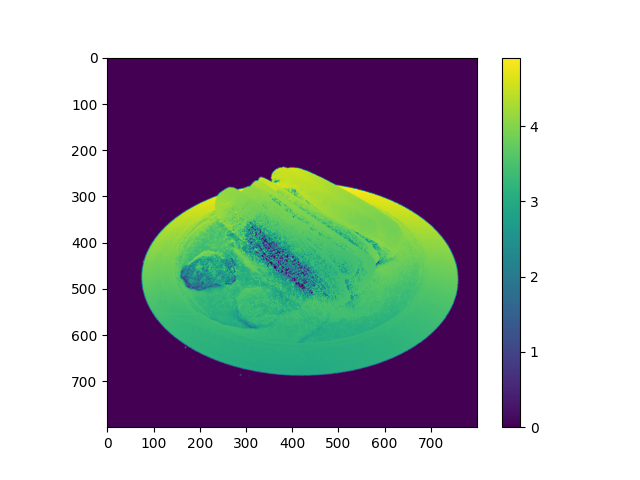

In [1119]:
# Render
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, depth= render_pkg["render"], render_pkg["depth"]
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]


# Visualize
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
depth_np = depth.detach().cpu().numpy()
plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
depth_np = depth_cont.detach().cpu().numpy()
plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()

## 

## Add local shape descriptors.

In [1120]:

def get_descriptors(X, X_nns_indices):
    """
    Returns a matrix of distances between all points specified in the X_nns_indices matrix.
    :param X: tensor or shape [N,d]
    :param X_nns_indices: tensor of shape [N,k]
    :return 
        distances_nns : tensor of shape [N, k,k] with pairwise distances between all of the 
            k NNs for every sample in X.
    """
    
    X_nns = X[X_nns_indices]
    # All pairs can be too much
    # distances_nns = torch.norm(X_nns.unsqueeze(1) - X_nns.unsqueeze(2), dim=-1)
    # Just take all distances to the nearest neighbors
    distances_nns = torch.norm(X_nns[:,1:] - X_nns[:,0].unsqueeze(1), dim=-1)
    return distances_nns
    
def get_style_patch_descriptors_loss(clusters_to_opt_list, nns_indices, target_descriptor_cluster):
    """
    For every cluster of points in the clusters_to_opt_list we compute its descriptor of spatial 
    positions between all pairs of points within this cluster. Afterwards we compare this descriptor
    with the target descriptor.
    """
    loss_local_descriptor_list = []
    loss = 0.
    for cluster_points in clusters_to_opt_list:
        descriptor_points = get_descriptors(X=cluster_points, X_nns_indices=nns_indices)
        loss_local_descriptor = torch.mean(torch.square(descriptor_points - target_descriptor_cluster))
        loss += loss_local_descriptor 
        loss_local_descriptor_list.append(loss_local_descriptor)

    return loss / len(clusters_to_opt_list)


# now find initial desctiptors 

num_nns = 200
kth_nn = 20
num_nns_local = 100 # was 100
kth_nn_local = 1

distances = torch.cdist(gaussians_opt._xyz.data[:N], gaussians_opt._xyz.data[:N])
_, nns_indices = torch.topk(distances, k=num_nns, largest=False, dim=-1)

nns_indices = nns_indices[:, ::kth_nn]

target_descriptor_cluster = get_descriptors(X=gaussians_opt._xyz.data[:N], 
                                            X_nns_indices=nns_indices)
target_descriptor_cluster = target_descriptor_cluster.clone().detach()
target_descriptor_cluster.shape


torch.Size([2714, 9])

In [1121]:


get_style_patch_descriptors_loss(clusters_to_opt_list=[gaussians_opt._xyz[:N]],
                                 nns_indices=nns_indices,
                                 target_descriptor_cluster=target_descriptor_cluster)



tensor(0., device='cuda:0', grad_fn=<DivBackward0>)

In [1122]:
# gaussians_opt._xyz.data = torch.concat([torch.tensor( (gaussians_xyz - np.mean(gaussians_xyz, axis=0))*1.5 + np.random.normal(size=gaussians_xyz.shape).astype(np.float32) / 1e1 + cluster_center).to(device=device) 
#                                           for cluster_center in content_shape_cluster_centers])

# gaussians_opt._xyz.data = torch.concat([torch.tensor( (gaussians_xyz - np.mean(gaussians_xyz, axis=0))*2.5 + np.random.normal(size=gaussians_xyz.shape).astype(np.float32) / 2e0).to(device=device) 
#                                           for cluster_center in content_shape_cluster_centers])


# gaussians_opt._xyz.data = torch.concat([torch.tensor( (gaussians_xyz - np.mean(gaussians_xyz, axis=0))*2.5 + np.random.normal(size=gaussians_xyz.shape[-1]).astype(np.float32) / 2e0 + cluster_center).to(device=device) 
#                                           for cluster_center in content_shape_cluster_centers])


gaussians_opt._xyz.data = torch.concat([torch.tensor( (gaussians_xyz - np.mean(gaussians_xyz, axis=0))*2.0 + np.random.normal(size=gaussians_xyz.shape[-1]).astype(np.float32) / 2e1 + cluster_center).to(device=device) 
                                          for cluster_center in content_shape_cluster_centers])

gaussians_opt._features_dc.data = gaussians_opt._features_dc.data * 0.

In [1123]:


get_style_patch_descriptors_loss(clusters_to_opt_list=[gaussians_opt._xyz[:N]],
                                 nns_indices=nns_indices,
                                 target_descriptor_cluster=target_descriptor_cluster)



tensor(0.0009, device='cuda:0', grad_fn=<DivBackward0>)

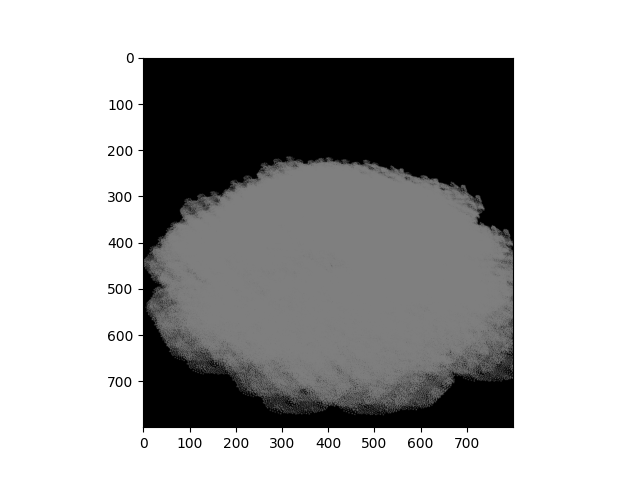

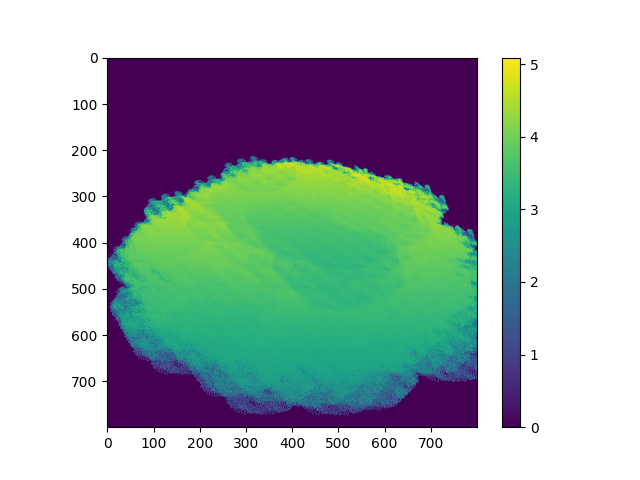

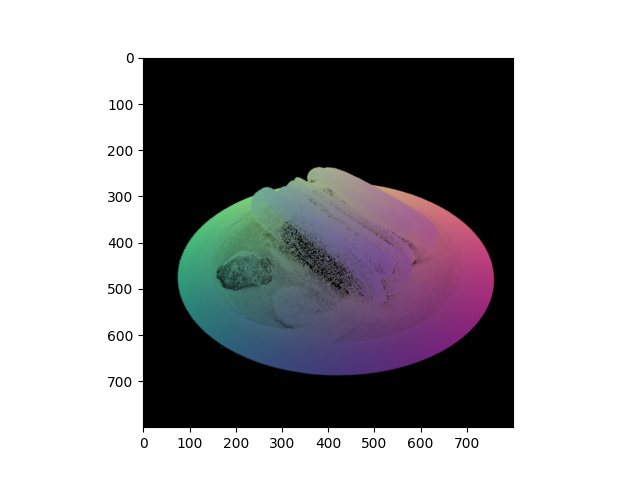

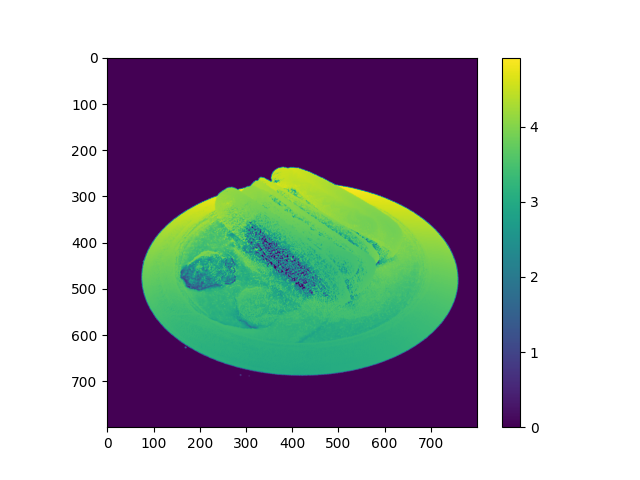

In [1125]:
# Render
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, depth= render_pkg["render"], render_pkg["depth"]
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]


# Visualize
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
depth_np = depth.detach().cpu().numpy()
plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
depth_np = depth_cont.detach().cpu().numpy()
plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()

In [1126]:
losses_full=[]
losses_pixel = []
losses_reg = []
losses_tv = []
losses_loc_descr = []


gaussians_opt.training_setup(opt)
# for param_group in gaussians_opt.optimizer.param_groups:
#         param_group['lr'] = 1e-4

gaussians_opt._xyz.requires_grad = False
gaussians_opt._features_dc.requires_grad = True
gaussians_opt._features_rest.requires_grad = False
gaussians_opt._scaling.requires_grad = False
gaussians_opt._rotation.requires_grad = False
gaussians_opt._opacity.requires_grad = False
gaussians_opt.max_radii2D.requires_grad = False



gaussians_opt._xyz.requires_grad = True
gaussians_opt._features_dc.requires_grad = True
gaussians_opt._features_rest.requires_grad = False
gaussians_opt._scaling.requires_grad = False
gaussians_opt._rotation.requires_grad = False
gaussians_opt._opacity.requires_grad = False
gaussians_opt.max_radii2D.requires_grad = False



gaussians_opt._xyz.requires_grad = True
gaussians_opt._features_dc.requires_grad = True
gaussians_opt._features_rest.requires_grad = False
gaussians_opt._scaling.requires_grad = False
gaussians_opt._rotation.requires_grad = False
gaussians_opt._opacity.requires_grad = True
gaussians_opt.max_radii2D.requires_grad = False




gaussians_opt._xyz.requires_grad = True
gaussians_opt._features_dc.requires_grad = True
gaussians_opt._features_rest.requires_grad = False
gaussians_opt._scaling.requires_grad_ = True
gaussians_opt._rotation.requires_grad = False
gaussians_opt._opacity.requires_grad = False
gaussians_opt.max_radii2D.requires_grad = False



gaussians_opt._xyz.requires_grad = True
gaussians_opt._features_dc.requires_grad = True
gaussians_opt._features_rest.requires_grad = False
gaussians_opt._scaling.requires_grad_ = True
gaussians_opt._rotation.requires_grad = False
gaussians_opt._opacity.requires_grad = True
gaussians_opt.max_radii2D.requires_grad = False


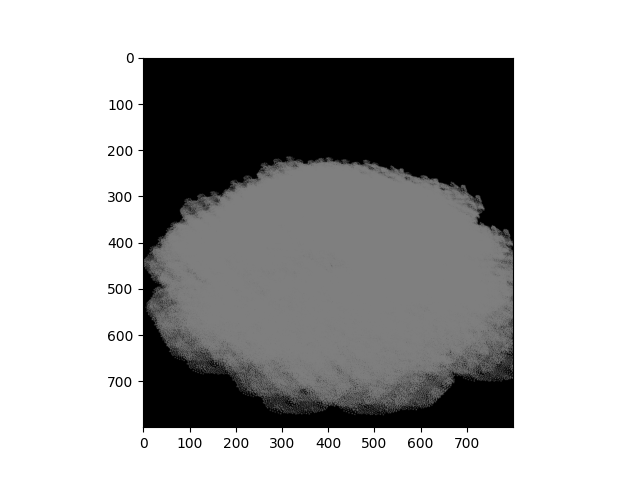

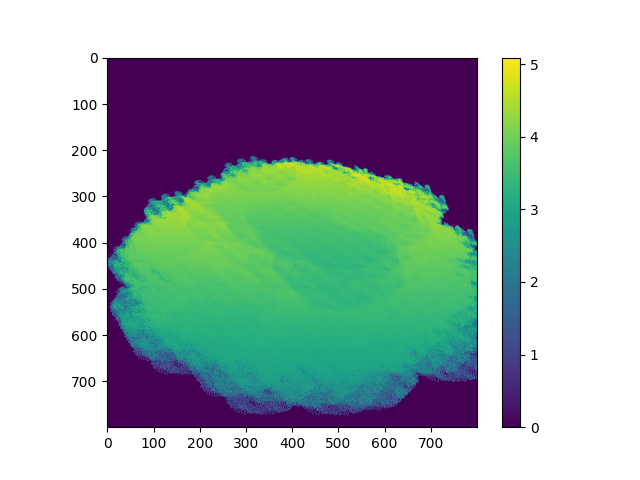

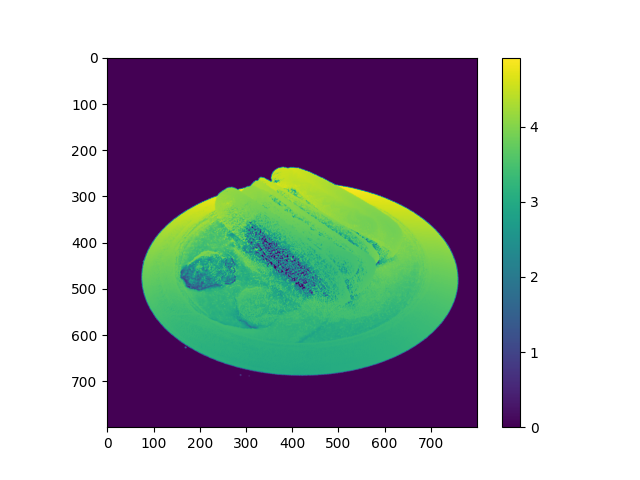

In [1127]:
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


depth_np = depth.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()


depth_np = depth_cont.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()

In [1128]:
# Random sampling viewpoint



# def loss_to_depth_target(d, d_trg):
#     return torch.mean(torch.square(d - d_trg) * (d_trg>0.5))

def loss_to_depth_target(d, d_trg):
    return torch.mean(torch.square(d - d_trg))


from torchvision.transforms import v2
blurrer = v2.GaussianBlur(kernel_size=(31, 31), sigma=(30., 30.))


def loss_to_depth_target(d, d_trg, make_BG_large=False, blur_depth=False, blr_sgm=1.):
    d_ = d
    d_trg_ = d_trg
    if make_BG_large:
        d_trg_ = d_trg_ + (d_trg_<1e-2) * 1e2
    if blur_depth:
        d_ = gaussian_filter_2d(d_, sigma=blr_sgm)
        d_trg_ = gaussian_filter_2d(d_trg_, sigma=blr_sgm)
    return torch.mean(torch.square(d_ - d_trg_))# * (d_trg>0.01))

def renorm_cluster(cluster):
    """
    Provided a cluster of coordinates center it and normalize
    """
    return (cluster - torch.mean(cluster, dim=-1, keepdim=True)) / torch.std(cluster, dim=-1, keepdim=True)
    
if True:
    for step in tqdm(range(5001)):
        gaussians_opt.optimizer.zero_grad()
        # Pick a random Camera
        
        if not viewpoint_stack:
            viewpoint_stack = scene_opt.getTrainCameras().copy()
        
        # if step < 2:
        viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
        # Optimization gaussians
        render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
        image, depth= render_pkg["render"], render_pkg["depth"]
        # Content gaussians
        render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
        image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]

        depth_target = depth_cont.clone().detach().to(device=device)

        
        # loss_descriptor_local = get_style_patch_descriptors_loss(
        #     clusters_to_opt_list=[renorm_cluster(gaussians_opt._xyz[i*N:(i+1)*N]) 
        #                           for i in range(C)],
        #     nns_indices=nns_indices,
        #     target_descriptor_cluster=target_descriptor_cluster)
        loss_descriptor_local = get_style_patch_descriptors_loss(
            clusters_to_opt_list=[gaussians_opt._xyz[i*N:(i+1)*N] for i in range(C)],
            nns_indices=nns_indices,
            target_descriptor_cluster=target_descriptor_cluster)


        #loss_pixel = torch.mean(torch.square(image - image_cont))
        loss_pixel = l1_loss(image, image_cont)
        loss_depth = l1_loss(depth, depth_cont)
        l_tv = tv_loss(image)
        l_reg = torch.mean(torch.square(gaussians_opt._xyz.unsqueeze(1) - gaussians_opt._features_dc))
        
        # loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 1e3# tv_loss weight was 1e-3
        # loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 1e0# tv_loss weight was 1e-3
        # loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 1e1# tv_loss weight was 1e-3
        # Stage 1 
        # loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 1e-4
        # Stage 2 
        # loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 1e-3
        # # Stage 3
        # loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 1e-1
        # # Stage 4
        # loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 1e0
        # Stage 5
        # loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 1e2
        loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 #+ loss_descriptor_local * 1e-4
        loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 + loss_descriptor_local * 1e3
        # loss = loss_depth
        loss.backward()
    
        gaussians_opt.optimizer.step()
        losses_full.append(float(loss.detach().cpu().numpy()))
        losses_pixel.append(float(loss_pixel.detach().cpu().numpy()))
        losses_reg.append(float(l_reg.detach().cpu().numpy()))
        losses_tv.append(float(l_tv.detach().cpu().numpy()))
        losses_loc_descr.append(float(loss_descriptor_local.detach().cpu().numpy()))
  
    

        
        if step % 100 == 0:
            print(losses[-1])
            print(f"l_reg:{l_reg:.7f}, loss_descriptor_local:{loss_descriptor_local:.7f},",
                  f"l_tv:{l_tv:.7f}, loss_pixel:{loss_pixel:.7f}, loss:{loss:.7f}")

   



/tmp/ipykernel_446665/3949825945.py:33: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for step in tqdm(range(5001)):


  0%|          | 0/5001 [00:00<?, ?it/s]

RuntimeError: Function SubBackward0 returned an invalid gradient at index 1 - got [678500, 1, 3] but expected shape compatible with [664930, 1, 3]

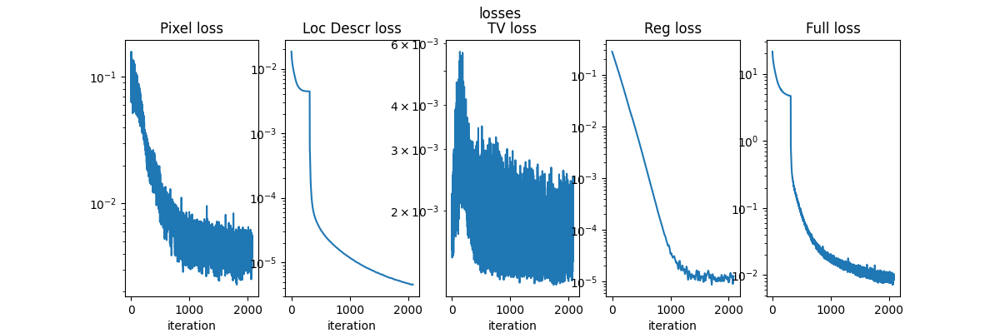

In [1030]:
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(12,4))
fig.suptitle("losses")
ax[0].set_title("Pixel loss")
ax[0].plot(losses_pixel)
ax[0].set_yscale('log')
ax[1].set_title("Loc Descr loss")
ax[1].plot(losses_loc_descr)
ax[1].set_yscale('log')

ax[2].set_title("TV loss")
ax[2].plot(losses_tv)
ax[2].set_yscale('log')
ax[3].set_title("Reg loss")
ax[3].plot(losses_reg)
ax[3].set_yscale('log')
ax[4].set_title("Full loss")
ax[4].plot(losses_full)
ax[4].set_yscale('log')

for i in range(4): ax[i].set_xlabel("iteration")

plt.show()

In [908]:
gaussians_opt._scaling

Parameter containing:
tensor([[-5.0764, -5.0758, -5.0765],
        [-5.0767, -5.0758, -5.0759],
        [-5.0759, -5.0761, -5.0764],
        ...,
        [-5.0764, -5.0759, -5.0761],
        [-5.0759, -5.0765, -5.0761],
        [-5.0764, -5.0764, -5.0758]], device='cuda:0')

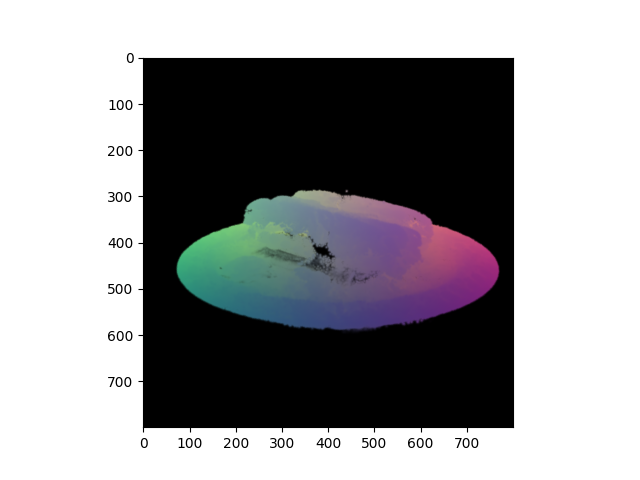

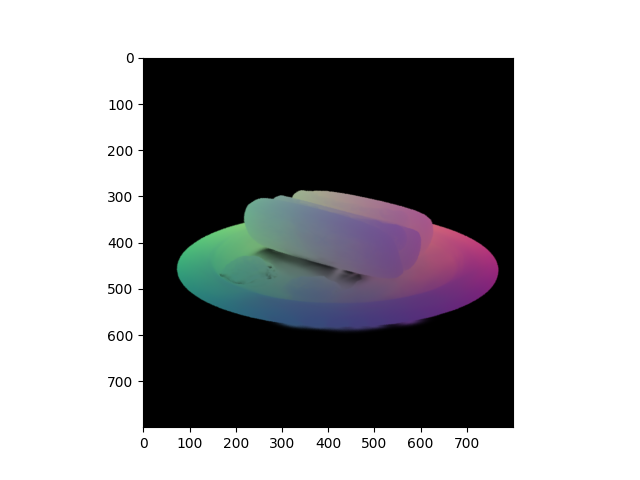

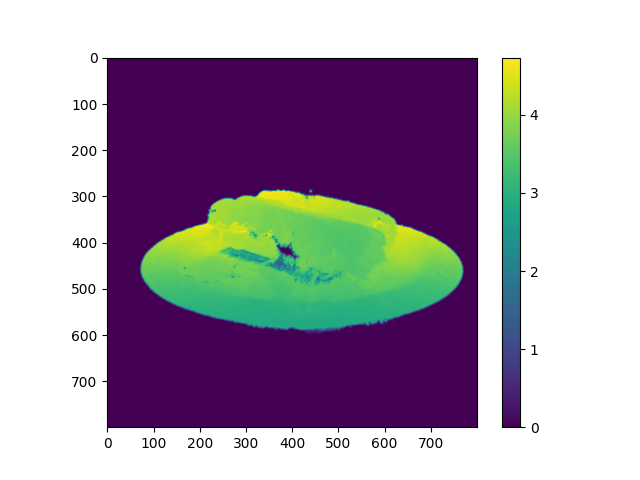

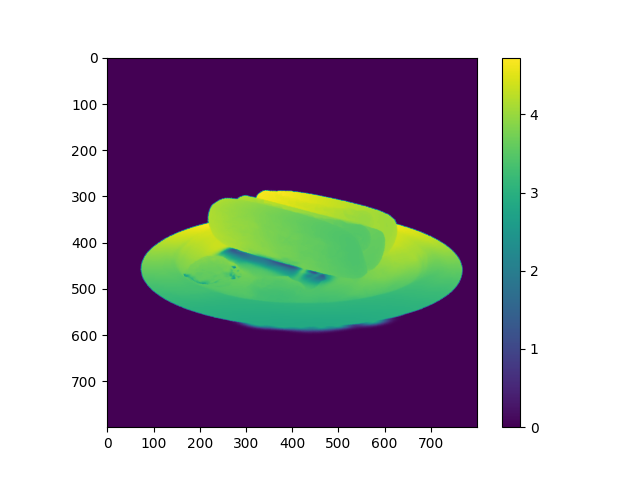

In [1031]:
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


depth_np = depth.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()


depth_np = depth_cont.detach().cpu().numpy()

plt.figure()
plt.imshow(depth_np)
plt.colorbar()
plt.show()

In [989]:
gaussians_opt_features_dc_fitted = gaussians_opt._features_dc.data.detach().clone()

In [990]:
gaussians_opt._features_dc.data = gaussians_opt_features_dc_original.clone()

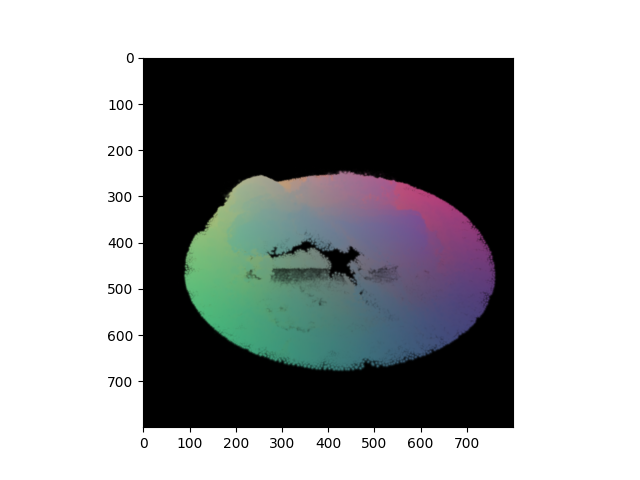

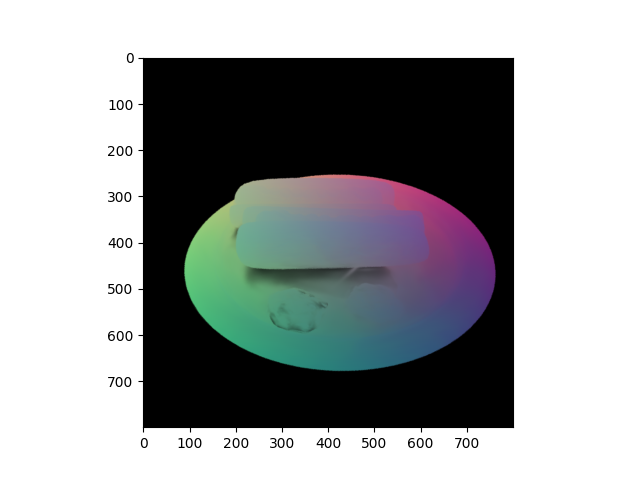

In [1028]:
# Sample camera
viewpoint_stack = scene_opt.getTrainCameras().copy()
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))


# Render
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, depth= render_pkg["render"], render_pkg["depth"]
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]


# Visualize
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
# depth_np = depth.detach().cpu().numpy()
# plt.figure()
# plt.imshow(depth_np)
# plt.colorbar()
# plt.show()
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
# depth_np = depth_cont.detach().cpu().numpy()
# plt.figure()
# plt.imshow(depth_np)
# plt.colorbar()
# plt.show()

In [984]:
gaussians_opt._features_dc.data = gaussians_opt_features_dc_fitted.clone()

In [115]:
# Random sampling viewpoint



# def loss_to_depth_target(d, d_trg):
#     return torch.mean(torch.square(d - d_trg) * (d_trg>0.5))

def loss_to_depth_target(d, d_trg):
    return torch.mean(torch.square(d - d_trg))


from torchvision.transforms import v2
blurrer = v2.GaussianBlur(kernel_size=(31, 31), sigma=(30., 30.))


def loss_to_depth_target(d, d_trg, make_BG_large=False, blur_depth=False, blr_sgm=1.):
    d_ = d
    d_trg_ = d_trg
    if make_BG_large:
        d_trg_ = d_trg_ + (d_trg_<1e-2) * 1e2
    if blur_depth:
        d_ = gaussian_filter_2d(d_, sigma=blr_sgm)
        d_trg_ = gaussian_filter_2d(d_trg_, sigma=blr_sgm)
    return torch.mean(torch.square(d_ - d_trg_))# * (d_trg>0.01))
    
if True:
    for step in tqdm(range(5001)):
        gaussians_opt.optimizer.zero_grad()
        # Pick a random Camera
        
        if not viewpoint_stack:
            viewpoint_stack = scene_opt.getTrainCameras().copy()
        
        # if step < 2:
        viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
        # Optimization gaussians
        render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
        image, depth= render_pkg["render"], render_pkg["depth"]
        # Content gaussians
        render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
        image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]

        depth_target = depth_cont.clone().detach().to(device=device)

        
        loss_descriptor_local = get_style_patch_descriptors_loss(
            clusters_to_opt_list=[gaussians_opt._xyz[i*N:(i+1)*N] for i in range(C)],
            nns_indices=nns_indices,
            target_descriptor_cluster=target_descriptor_cluster)


        loss_pixel = torch.mean(torch.square(image - image_cont))
        l_tv = tv_loss(image)
        l_reg = torch.mean(torch.square(gaussians_opt._xyz.unsqueeze(1) - gaussians_opt._features_dc))
        
        loss = loss_pixel * 1e0  + l_tv * 1e-5 + l_reg * 1e1 + 1e3* loss_descriptor_local# tv_loss weight was 1e-3
        
        loss.backward()
    
        gaussians_opt.optimizer.step()
        losses.append(float(loss.detach().cpu().numpy()))#loss.cpu().numpy)
        
        if step % 100 == 0:
            print(losses[-1])
            print(f"l_reg:{l_reg:.7f}, loss_descriptor_local:{loss_descriptor_local:.7f},",
                  f"l_tv:{l_tv:.7f}, loss_pixel:{loss_pixel:.7f}, loss:{loss:.7f}")

   



/tmp/ipykernel_446665/2881759005.py:27: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for step in tqdm(range(5001)):


  0%|          | 0/5001 [00:00<?, ?it/s]

0.3319844901561737
l_reg:0.0000019, loss_descriptor_local:0.0003278, l_tv:0.0026147, loss_pixel:0.0041384, loss:0.3319845
0.04382710158824921
l_reg:0.0000168, loss_descriptor_local:0.0000195, l_tv:0.0047906, loss_pixel:0.0241651, loss:0.0438271


KeyboardInterrupt: 

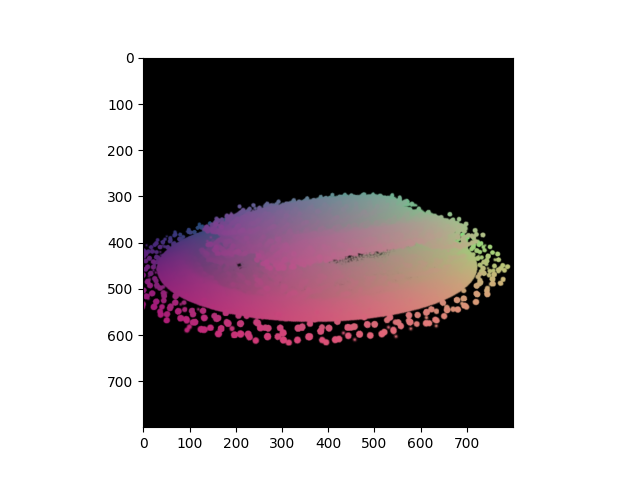

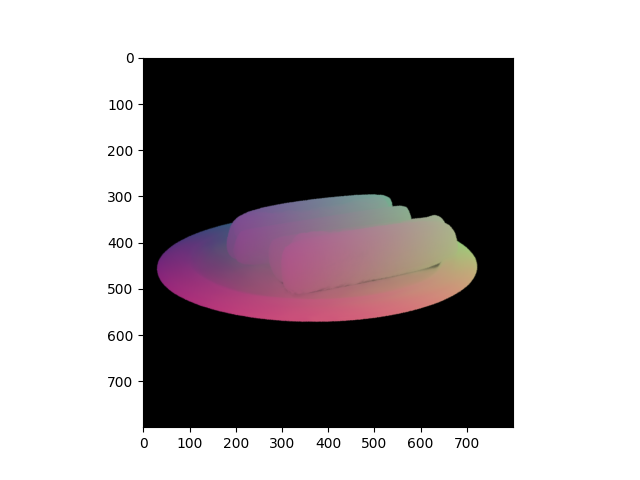

In [144]:
# Sample camera
viewpoint_stack = scene_opt.getTrainCameras().copy()
viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))


# Render
render_pkg = render(viewpoint_cam, gaussians_opt, pipe, background)
image, depth= render_pkg["render"], render_pkg["depth"]
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]


# Visualize
image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
# depth_np = depth.detach().cpu().numpy()
# plt.figure()
# plt.imshow(depth_np)
# plt.colorbar()
# plt.show()
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()
# depth_np = depth_cont.detach().cpu().numpy()
# plt.figure()
# plt.imshow(depth_np)
# plt.colorbar()
# plt.show()